#🚕 Cab Investment Firm - Cab Data Analysis 🚕
> The Client

XYZ is a private firm in US. Due to remarkable growth in the Cab Industry in last few years and multiple key players in the market, it is planning for an investment in Cab industry and as per their Go-to-Market(G2M) strategy they want to understand the market before taking final decision.

> Project delivery:

You have been provided with multiple data sets that contains information on 2 cab companies. Each file (data set) provided represents different aspects of the customer profile. XYZ is interested in using your actionable insights to help them identify the right company to make their investment.

The outcome of your delivery will be a presentation to XYZ’s Executive team. This presentation will be judged based on the visuals provided, the quality of your analysis and the value of your recommendations and insights.

> Data Set:

You have been provided 4 individual data sets. Time period of data is from 31/01/2016 to 31/12/2018.

Below are the list of datasets which are provided for the analysis:

* Cab_Data.csv – this file includes details of transaction for 2 cab companies

* Customer_ID.csv – this is a mapping table that contains a unique identifier which links the customer’s demographic details

* Transaction_ID.csv – this is a mapping table that contains transaction to customer mapping and payment mode

* City.csv – this file contains list of US cities, their population and number of cab users

You should fully investigate and understand each data set.

```
Review the Source Documentation
Understand the field names and data types
Identify relationships across the files
Field/feature transformations
Determine which files should be joined versus which ones should be appended
Create master data and explain the relationship
Identify and remove duplicates
Perform other analysis like NA value and outlier detection
```



# ⬇️ Imports | Constants | Functions

In [2]:
# Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [3]:
# Constants
PALETTE = ['#E11584', '#FEE12B'] # Pink, Yellow
HUE_ORDER=["Pink Cab","Yellow Cab"] # Pink, Yellow

# 🏗️ Data Prep

In [4]:
df_city=pd.read_csv('City.csv')
df_cab_data=pd.read_csv('Cab_Data.csv')
df_customers=pd.read_csv('Customer_ID.csv')
df_transactions=pd.read_csv('Transaction_ID.csv')

In [5]:
df_city.shape,df_cab_data.shape,df_customers.shape,df_transactions.shape

((20, 3), (359392, 7), (49171, 4), (440098, 3))

In [6]:
df_cab_data.head(3)

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip
0,10000011,42377,Pink Cab,ATLANTA GA,30.45,370.95,313.635
1,10000012,42375,Pink Cab,ATLANTA GA,28.62,358.52,334.854
2,10000013,42371,Pink Cab,ATLANTA GA,9.04,125.20,97.632


In [7]:
# Merge all datasets to create a master data set.
master_df=pd.merge(left=df_cab_data,right=df_transactions,
                   on='Transaction ID',how='left') # Left join Cab-data and transactions data

master_df=pd.merge(left=master_df,right=df_city,
                   on='City',how='left') # Left join Cab-data and City

master_df=pd.merge(left=master_df,right=df_customers,
                   on='Customer ID',how='left') # Left join transactions and customers data
master_df=master_df.sort_values(by=['Date of Travel']).reset_index(drop=True)
master_df.rename(columns={"Transaction ID": "Transaction_id",
                          "KM Travelled": "Distance_travelled",
                          "Price Charged": "Price_charged",
                          "Cost of Trip": "Trip_cost",
                          "Customer ID": "Customer_id",
                          "Payment_Mode": "Payment_mode",
                          "Income (USD/Month)": "Income",
                          "City": "City_State",
                          }, inplace=True)
# Change excel date format to %Y-%m-%d
master_df['Travel_date']=(pd.to_datetime('1899-12-30')\
 + pd.to_timedelta(master_df['Date of Travel'], 'D'))
master_df.set_index('Travel_date', inplace=True)
master_df.drop(['Date of Travel'], axis=1, inplace=True)

# City, State distribution
master_df[['City', 'State']] = master_df['City_State'].str.rsplit(' ', 1,
                                                                 expand=True)
master_df.drop(['City_State'], axis=1, inplace=True)

# Prep `Population` and `Users` fields
master_df['Population']=master_df['Population'].apply(lambda x: int(x.replace(',','')))
master_df['Users']=master_df['Users'].apply(lambda x: int(x.replace(',','')))
master_df['User_density']=(master_df['Users']/master_df['Population'])*100


# Calculate Profits from Price_charged and Trip_cost
master_df['Profit']=master_df['Price_charged']-master_df['Trip_cost']
master_df['Profit_per_KM']=master_df['Profit']/master_df['Distance_travelled']
master_df

,Transaction_id,Company,Distance_travelled,Price_charged,Trip_cost,Customer_id,Payment_mode,Population,Users,Gender,Age,Income,City,State,User_density,Profit,Profit_per_KM
Travel_date,,,,,,,,,,,,,,,,,
2016-01-02,10001340,Yellow Cab,10.20,202.54,135.8640,52536,Card,418859,127001,Male,24,10606,WASHINGTON,DC,30.320705,66.6760,6.536863
2016-01-02,10000640,Yellow Cab,15.60,374.66,209.6640,4844,Cash,1955130,164468,Male,32,5548,CHICAGO,IL,8.412126,164.9960,10.576667
2016-01-02,10000635,Yellow Cab,25.08,532.83,337.0752,5671,Cash,1955130,164468,Male,24,7081,CHICAGO,IL,8.412126,195.7548,7.805215
2016-01-02,10001001,Yellow Cab,46.80,1391.91,595.2960,2761,Card,8405837,302149,Male,40,11462,NEW YORK,NY,3.594514,796.6140,17.021667
2016-01-02,10000171,Pink Cab,14.28,269.15,147.0840,20687,Cash,959307,69995,Male,39,8926,SAN DIEGO,CA,7.296413,122.0660,8.548039
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-31,10435011,Yellow Cab,21.20,319.09,300.1920,10967,Card,1339155,17675,Female,63,16390,MIAMI,FL,1.319862,18.8980,0.891415
2018-12-31,10433309,Pink Cab,10.70,128.00,119.8400,8175,Card,1595037,144132,Male,24,12571,LOS ANGELES,CA,9.036279,8.1600,0.762617
2018-12-31,10435915,Yellow Cab,27.14,374.95,377.7888,45644,Card,545776,7044,Male,28,23014,SACRAMENTO,CA,1.290639,-2.8388,-0.104598


## Explore

In [8]:
master_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 359392 entries, 2016-01-02 to 2018-12-31
Data columns (total 17 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Transaction_id      359392 non-null  int64  
 1   Company             359392 non-null  object 
 2   Distance_travelled  359392 non-null  float64
 3   Price_charged       359392 non-null  float64
 4   Trip_cost           359392 non-null  float64
 5   Customer_id         359392 non-null  int64  
 6   Payment_mode        359392 non-null  object 
 7   Population          359392 non-null  int64  
 8   Users               359392 non-null  int64  
 9   Gender              359392 non-null  object 
 10  Age                 359392 non-null  int64  
 11  Income              359392 non-null  int64  
 12  City                359392 non-null  object 
 13  State               359392 non-null  object 
 14  User_density        359392 non-null  float64
 15  Profit            

In [9]:
round(master_df.describe(include='object'),3)

,Company,Payment_mode,Gender,City,State
count,359392,359392,359392,359392,359392
unique,2,2,2,19,15
top,Yellow Cab,Card,Male,NEW YORK,NY
freq,274681,215504,205912,99885,99885


In [10]:
round(master_df.describe(),3)

,Transaction_id,Distance_travelled,Price_charged,Trip_cost,Customer_id,Population,Users,Age,Income,User_density,Profit,Profit_per_KM
count,3.593920e+05,359392.000,359392.000,359392.000,359392.000,359392.000,359392.000,359392.000,359392.000,359392.000,359392.000,359392.000
mean,1.022076e+07,22.567,423.443,286.190,19191.652,3132198.044,158365.582,35.337,15048.823,10.669,137.253,6.084
std,1.268058e+05,12.234,274.379,157.994,21012.412,3315194.392,100850.051,12.594,7969.409,10.633,160.312,5.543
min,1.000001e+07,1.900,15.600,19.000,1.000,248968.000,3643.000,18.000,2000.000,0.650,-220.060,-4.998
25%,1.011081e+07,12.000,206.438,151.200,2705.000,671238.000,80021.000,25.000,8424.000,3.595,28.012,2.000
50%,1.022104e+07,22.440,386.360,282.480,7459.000,1595037.000,144132.000,33.000,14685.000,7.296,81.962,4.467
75%,1.033094e+07,32.960,583.660,413.683,36078.000,8405837.000,302149.000,42.000,21035.000,9.036,190.030,9.170
max,1.044011e+07,48.000,2048.030,691.200,60000.000,8405837.000,302149.000,65.000,35000.000,32.141,1463.966,41.116


In [11]:
master_df.isna().sum()

Transaction_id        0
Company               0
Distance_travelled    0
Price_charged         0
Trip_cost             0
Customer_id           0
Payment_mode          0
Population            0
Users                 0
Gender                0
Age                   0
Income                0
City                  0
State                 0
User_density          0
Profit                0
Profit_per_KM         0
dtype: int64

In [12]:
master_df.groupby(['State']).City.unique()

State
AZ                           [PHOENIX, TUCSON]
CA        [SAN DIEGO, SACRAMENTO, LOS ANGELES]
CO                                    [DENVER]
COUNTY                                [ORANGE]
DC                                [WASHINGTON]
FL                                     [MIAMI]
GA                                   [ATLANTA]
IL                                   [CHICAGO]
MA                                    [BOSTON]
NY                                  [NEW YORK]
PA                                [PITTSBURGH]
TN                                 [NASHVILLE]
TX                            [DALLAS, AUSTIN]
VALLEY                               [SILICON]
WA                                   [SEATTLE]
Name: City, dtype: object

# ✈️ EDA

In [ ]:
master_df.head()

,Transaction_id,Company,Distance_travelled,Price_charged,Trip_cost,Customer_id,Payment_mode,Population,Users,Gender,Age,Income,City,State,User_density,Profit,Profit_per_KM
Travel_date,,,,,,,,,,,,,,,,,
2016-01-02,10001340,Yellow Cab,10.20,202.54,135.8640,52536,Card,418859,127001,Male,24,10606,WASHINGTON,DC,30.320705,66.6760,6.536863
2016-01-02,10000640,Yellow Cab,15.60,374.66,209.6640,4844,Cash,1955130,164468,Male,32,5548,CHICAGO,IL,8.412126,164.9960,10.576667
2016-01-02,10000635,Yellow Cab,25.08,532.83,337.0752,5671,Cash,1955130,164468,Male,24,7081,CHICAGO,IL,8.412126,195.7548,7.805215
2016-01-02,10001001,Yellow Cab,46.80,1391.91,595.2960,2761,Card,8405837,302149,Male,40,11462,NEW YORK,NY,3.594514,796.6140,17.021667
2016-01-02,10000171,Pink Cab,14.28,269.15,147.0840,20687,Cash,959307,69995,Male,39,8926,SAN DIEGO,CA,7.296413,122.0660,8.548039


## Univariate Analysis

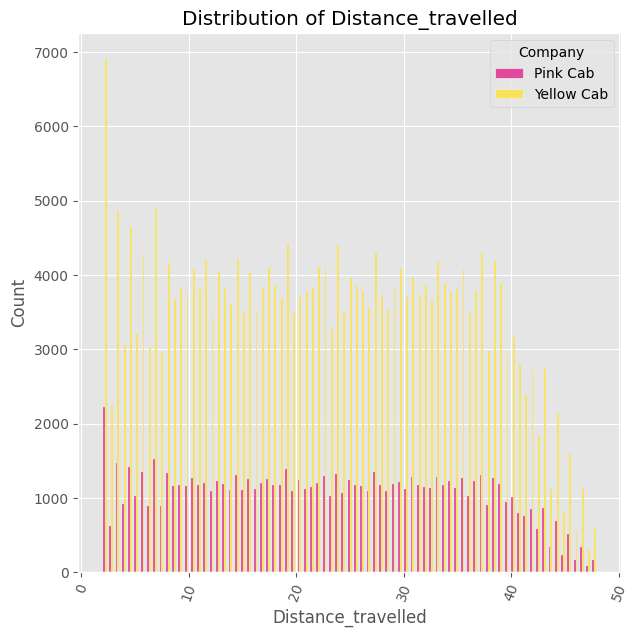

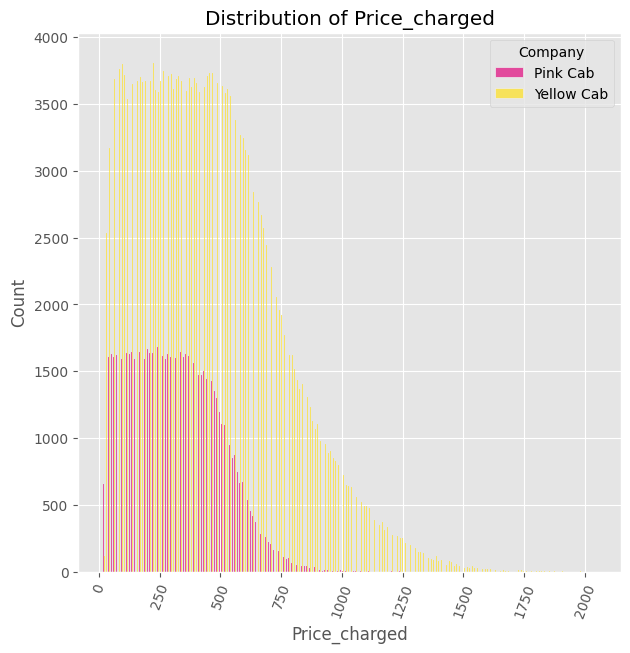

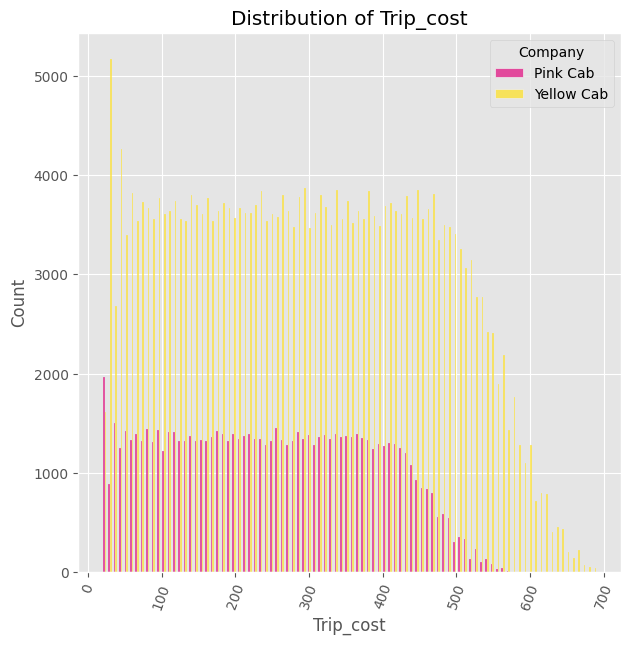

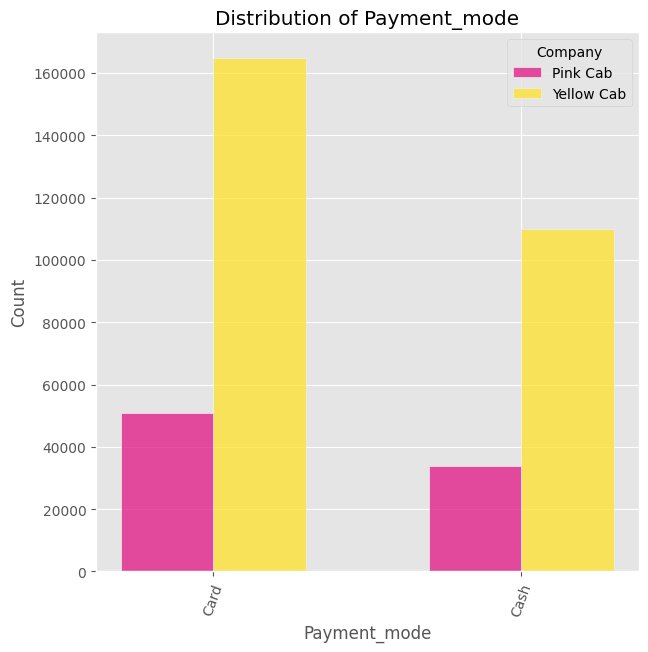

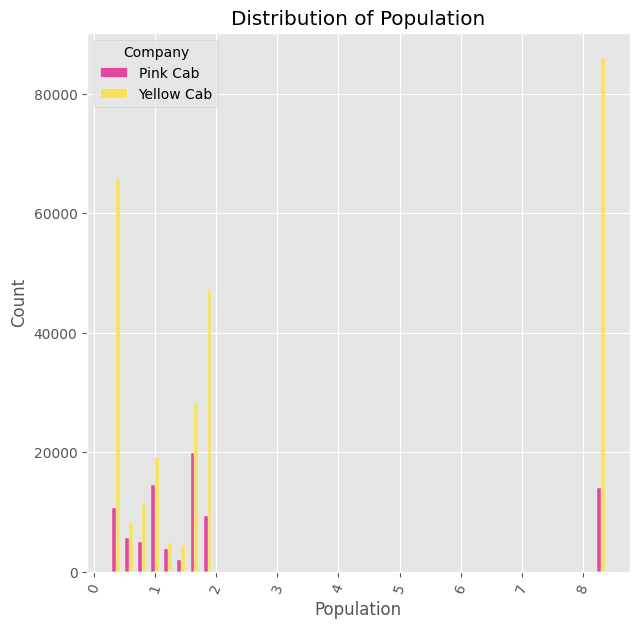

...

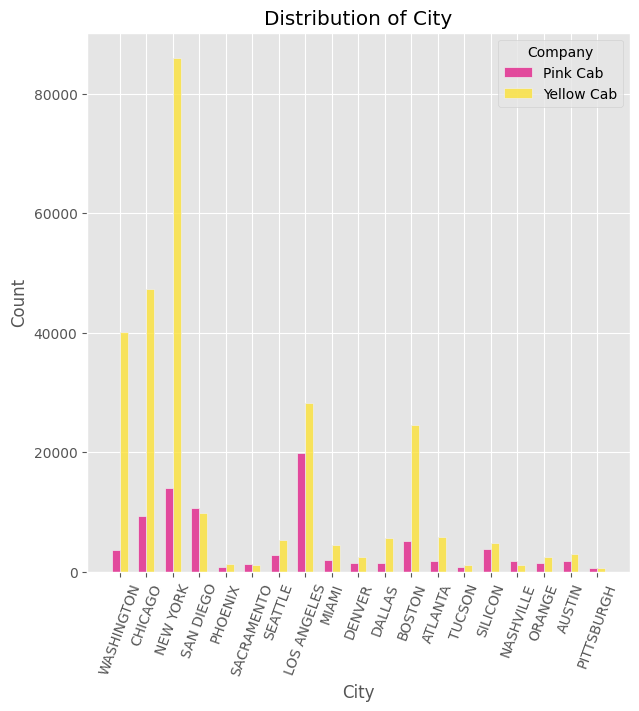

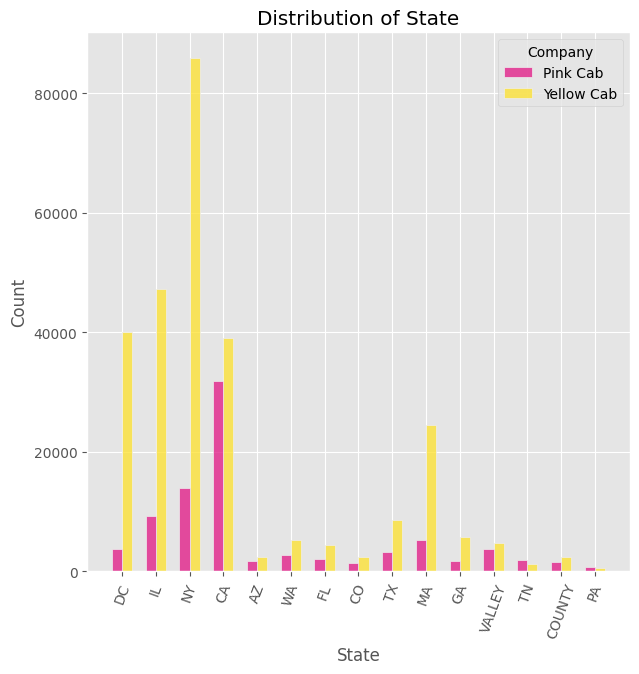

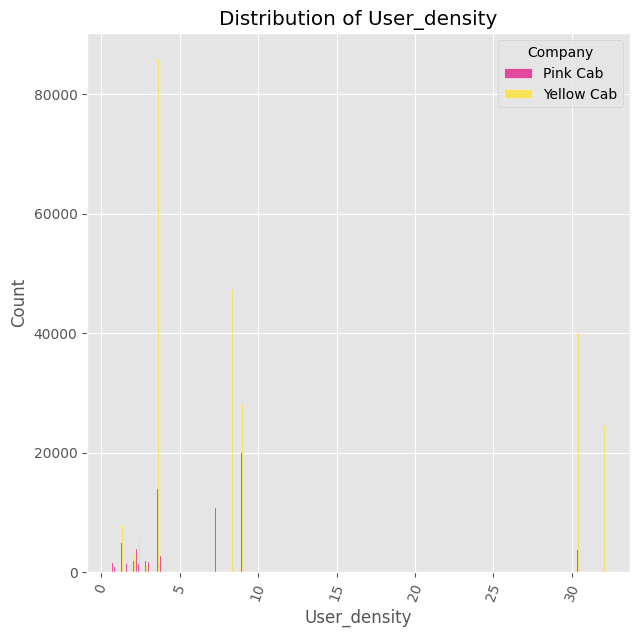

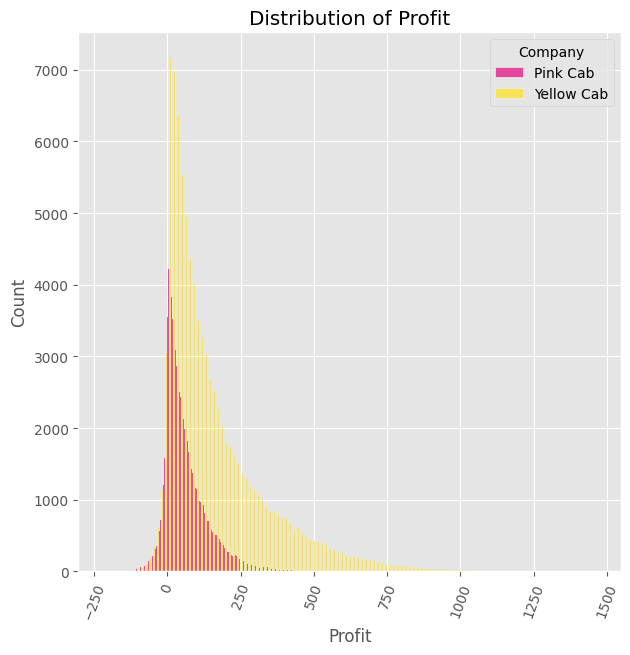

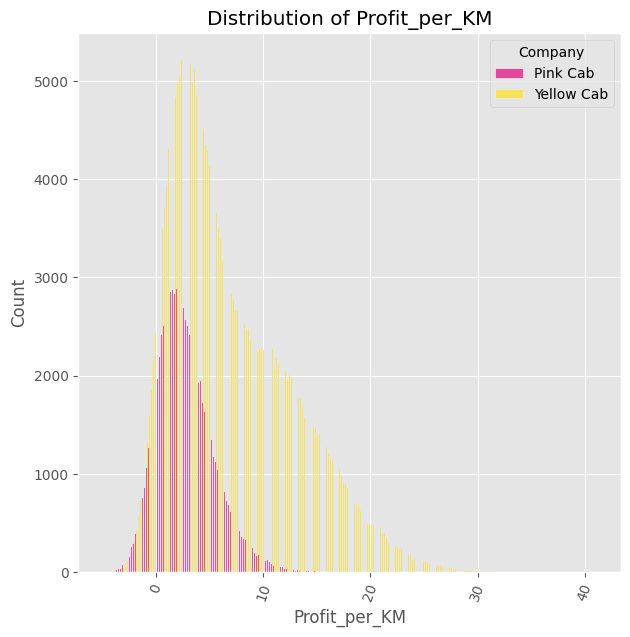

In [ ]:
for col in master_df.columns:
  if col in ["Transaction_id","Company","Customer_id"]:
    continue
  fig,ax=plt.subplots(figsize=(7,7))
  sns.histplot(data=master_df, x=col, hue_order=HUE_ORDER,
               hue='Company', multiple='dodge',palette=PALETTE,
               shrink=0.6,ax=ax)
  ax.set_title(f"Distribution of {col}")
  ax.set_xticklabels(ax.get_xticklabels(),rotation=70)
  plt.show();

In [ ]:
# !pip -qq install pandas-profiling[notebook,html]
import pandas_profiling
from pandas_profiling import ProfileReport
profile = ProfileReport(master_df, title="G2M Insights report",
                        html={'style': {'full_width': True}})
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# 💰 Profit Analysis for Investment Recommendations

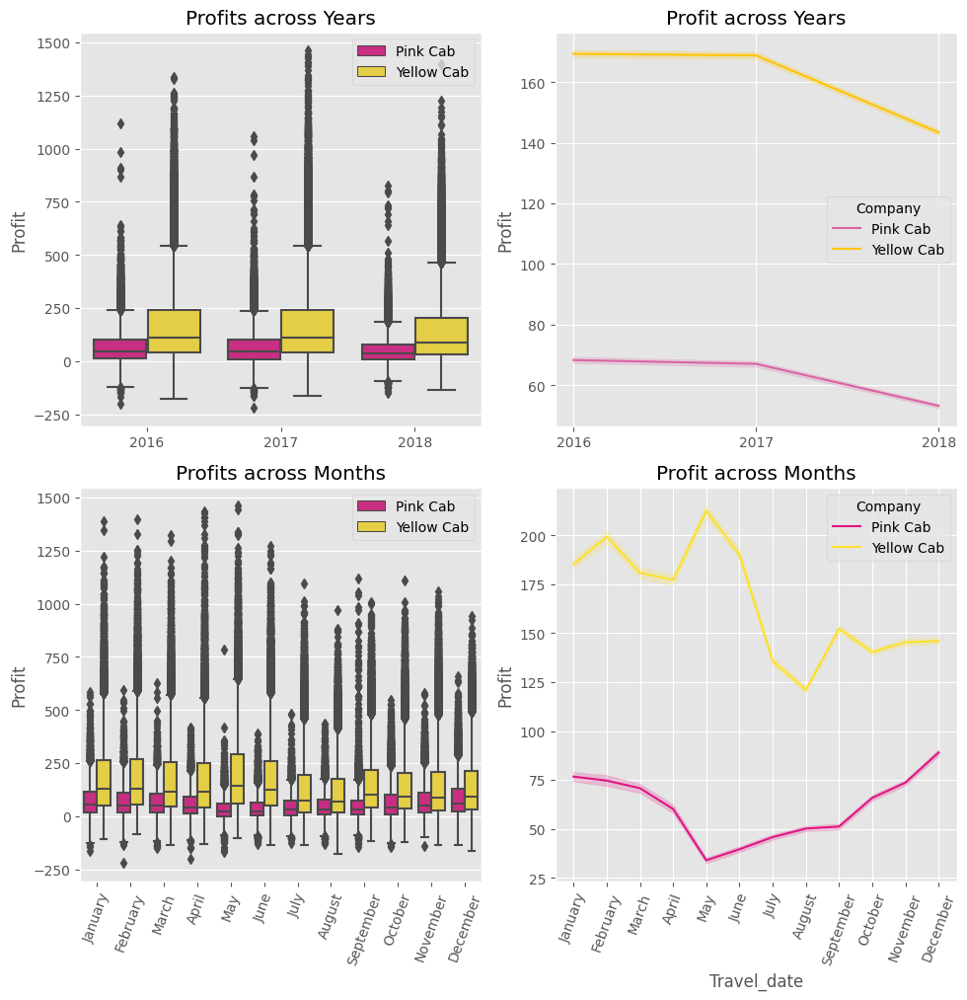

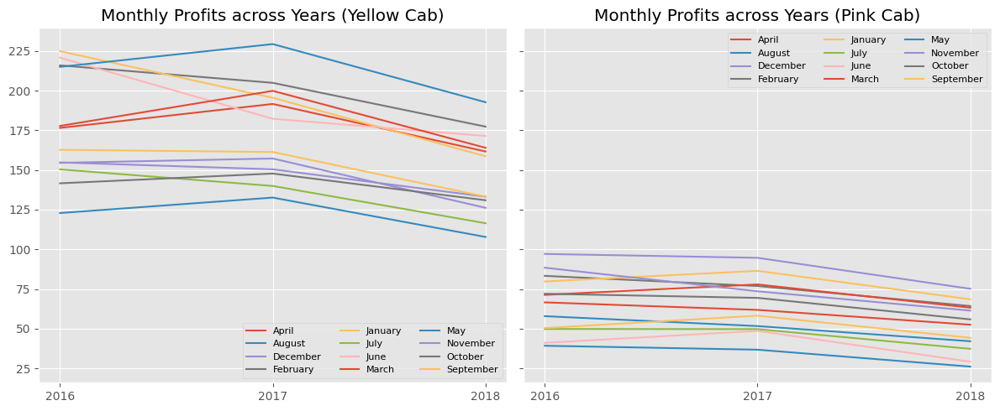

In [ ]:
#@title Profits across different Months and Years
#@markdown Yellow Cab has more yearly and monthly profits compared to Pink Cab.
#@markdown <br>Reasons can be:
#@markdown <br>1. Yellow Cab has more rides. Market share analysis required!
#@markdown <br>2. Yellow Cab charges more for the rides i.e. high profit rides.
#@markdown Price charged per Distance travelled analysis required!
fig,ax=plt.subplots(2,2,figsize=(10,10))
# 1. Profit vs year
plt.xticks(rotation=70);
sns.boxplot(ax=ax[0][0], data=master_df, x=master_df.index.year, hue='Company',
            hue_order=HUE_ORDER,y='Profit', dodge=True, palette=PALETTE)
ax[0][0].legend(loc='upper right')
ax[0][0].set_title("Profits across Years");
ax[0][0].set_xlabel("")

sns.lineplot(data=master_df,x=master_df.index.year,y='Profit', palette=['#d965a4', '#ffc400'],
             hue='Company',hue_order=HUE_ORDER, ax=ax[0][1]).set_title("Profit across Years")
ax[0][1].set_xticks([2016,2017,2018])
ax[0][1].set_xlabel("");
# ax[0][1].set_xticklabels(ax[0][1].get_xticklabels(), rotation=70);

# 2. Profit vs month
sns.boxplot(ax=ax[1][0], data=master_df, x=master_df.index.month_name(), hue='Company',
               y='Profit',hue_order=HUE_ORDER, dodge=True, palette=PALETTE)
ax[1][0].legend(loc='best')
ax[1][0].set_title("Profits across Months")
ax[1][0].set_xticklabels(ax[1][0].get_xticklabels(), rotation=70)
ax[1][0].set_xlabel("");
plt.tight_layout();

sns.lineplot(data=master_df,x=master_df.index.month_name(),y='Profit',
             palette=['#E11584', '#FEE12B'],hue='Company',hue_order=HUE_ORDER,
             ax=ax[1][1]).set_title("Profit across Months")
ax[1][1].set_xticklabels(ax[1][1].get_xticklabels(), rotation=70);

# 3. Profit vs month AND YEAR
pinkcab_df=master_df[master_df['Company']=='Pink Cab']
yellowcab_df=master_df[master_df['Company']=='Yellow Cab']
fig,ax=plt.subplots(ncols=2,figsize=(12,5), sharey=True)
monthly_profits_across_years_yellow = pd.pivot_table(yellowcab_df, values = 'Profit',
                                            columns = yellowcab_df.index.month_name(),
                                            index = yellowcab_df.index.year)
monthly_profits_across_years_yellow.plot(ax=ax[0])
ax[0].legend(loc='lower right',fontsize=8,ncols=3)
ax[0].set_title("Monthly Profits across Years (Yellow Cab)");
ax[0].set_xticks([2016,2017,2018]);
# ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation=70);
ax[0].set_xlabel("")

monthly_profits_across_years_pink = pd.pivot_table(pinkcab_df, values = 'Profit',
                                            columns = pinkcab_df.index.month_name(),
                                            index = pinkcab_df.index.year)
monthly_profits_across_years_pink.plot(ax=ax[1])
ax[1].legend(loc='upper right',fontsize=8,ncols=3)
ax[1].set_title("Monthly Profits across Years (Pink Cab)");
ax[1].set_xticks([2016,2017,2018]);
# ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation=70);
ax[1].set_xlabel("")
fig.tight_layout();



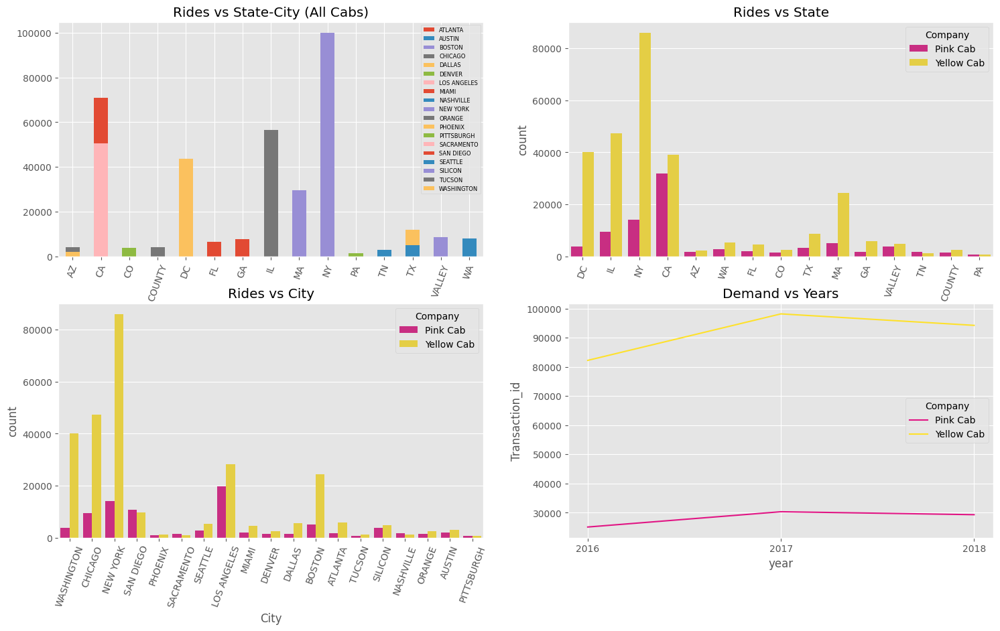

In [ ]:
#@title Market Share Analysis
#@markdown Yellow Cab's market share is greater than Pink Cab in most cities.
#@markdown <br>Demand for Yellow cabs keeps increasing compared to Pink Cabs.
fig,ax=plt.subplots(2,2,figsize=(18,10))
sns.countplot(data=master_df,x='City',hue='Company',
              hue_order=HUE_ORDER,palette=PALETTE,ax=ax[1][0]).set_title("Rides vs City")
ax[1][0].set_xticklabels(ax[1][0].get_xticklabels(),rotation=70);
sns.countplot(data=master_df,x='State',hue='Company',
              hue_order=HUE_ORDER,palette=PALETTE,ax=ax[0][1]).set_title("Rides vs State")
ax[0][1].set_xticklabels(ax[0][1].get_xticklabels(),rotation=70);
abt=master_df.groupby(['State','City']).Transaction_id.count().unstack(fill_value=0)
abt.plot(kind='bar', stacked=True,ax=ax[0][0])
ax[0][0].set_title("Rides vs State-City (All Cabs)")
ax[0][0].legend(loc='best',fontsize=6)
ax[0][0].set_xticklabels(ax[0][0].get_xticklabels(),rotation=70);
master_df['year']=master_df.index.year
abt=master_df.groupby(['year','Company']).Transaction_id.count().reset_index()
sns.lineplot(data=abt,x='year',y='Transaction_id',
             hue="Company",ax=ax[1][1],
             hue_order=HUE_ORDER, palette=PALETTE).set_title("Demand vs Years")
ax[1][1].set_xticks([2016,2017,2018]);

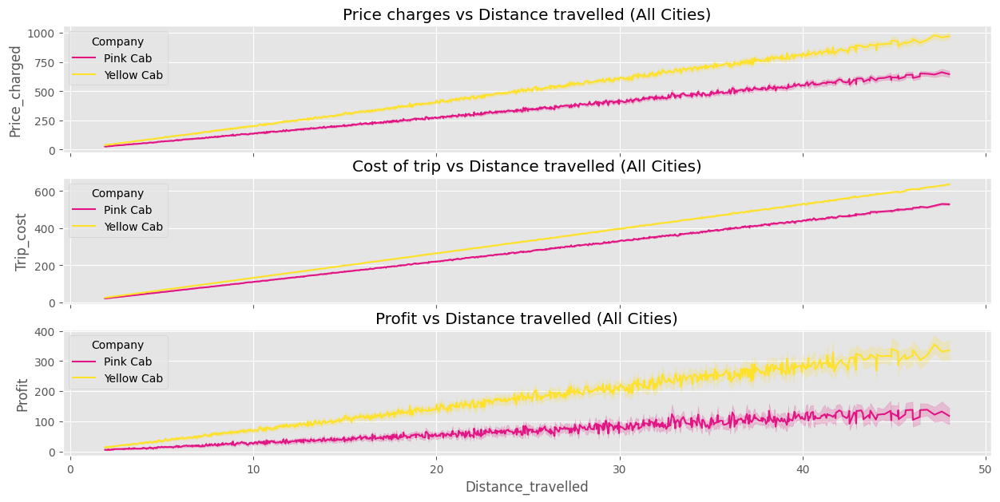

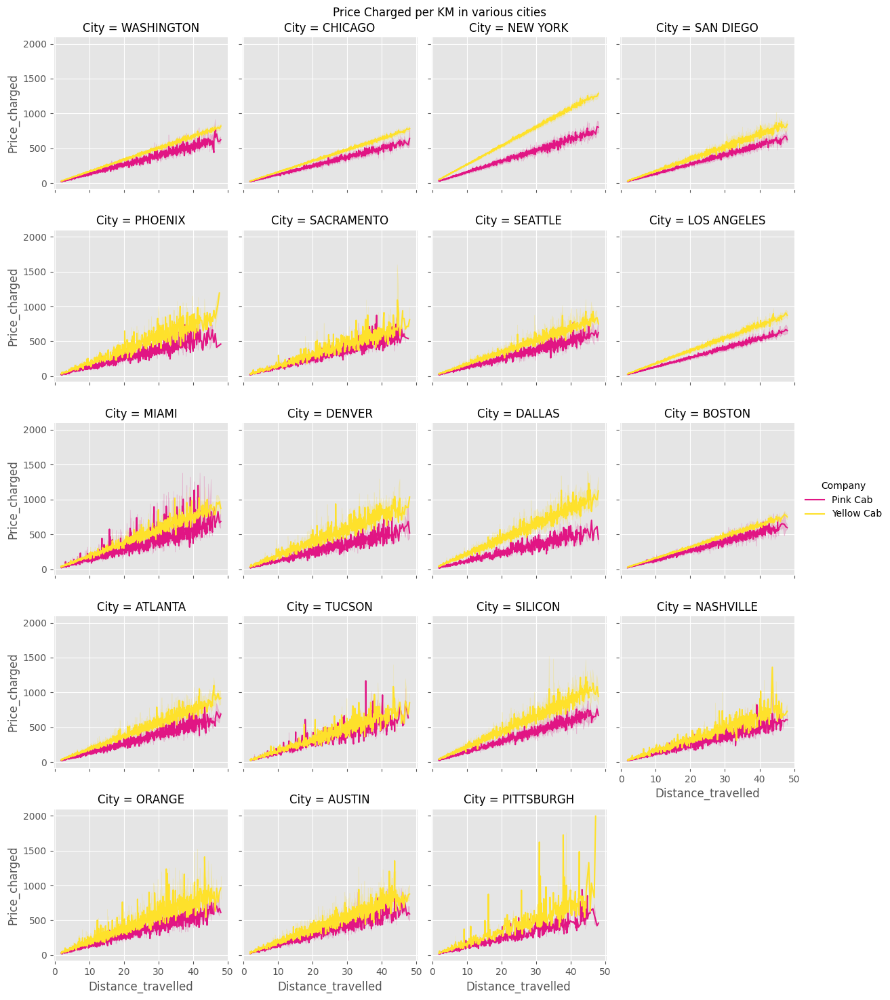

In [ ]:
#@title Price per distance travelled analysis
#@markdown Yellow Cab charges more prices per km in major cities such as New York.
#@markdown This explains the difference in profits between both the companies.
#@markdown <br>There can be other reasons for the higher price charges such as
#@markdown day of week, weather, demography etc.
fig,ax=plt.subplots(3,figsize=(15,7), sharex=True)
sns.lineplot(data=master_df, x='Distance_travelled', y='Price_charged',
             hue='Company', hue_order=HUE_ORDER, palette=PALETTE, ax=ax[0])
ax[0].set_title("Price charges vs Distance travelled (All Cities)")

sns.lineplot(data=master_df, x='Distance_travelled', y='Trip_cost',
             hue='Company', hue_order=HUE_ORDER, palette=PALETTE,ax=ax[1])
ax[1].set_title("Cost of trip vs Distance travelled (All Cities)");

sns.lineplot(data=master_df, x='Distance_travelled', y='Profit',
             hue='Company', hue_order=HUE_ORDER, palette=PALETTE,ax=ax[2])
ax[2].set_title("Profit vs Distance travelled (All Cities)");
plt.show();
g=sns.FacetGrid(master_df,hue='Company',col='City',col_wrap=4,
                hue_order=HUE_ORDER, palette=PALETTE, margin_titles=True)
g.map_dataframe(sns.lineplot,x='Distance_travelled',y='Price_charged')
g.fig.subplots_adjust(top=0.95)
g.fig.suptitle("Price Charged per KM in various cities")
g.add_legend();

# 📈 Visualising Trips

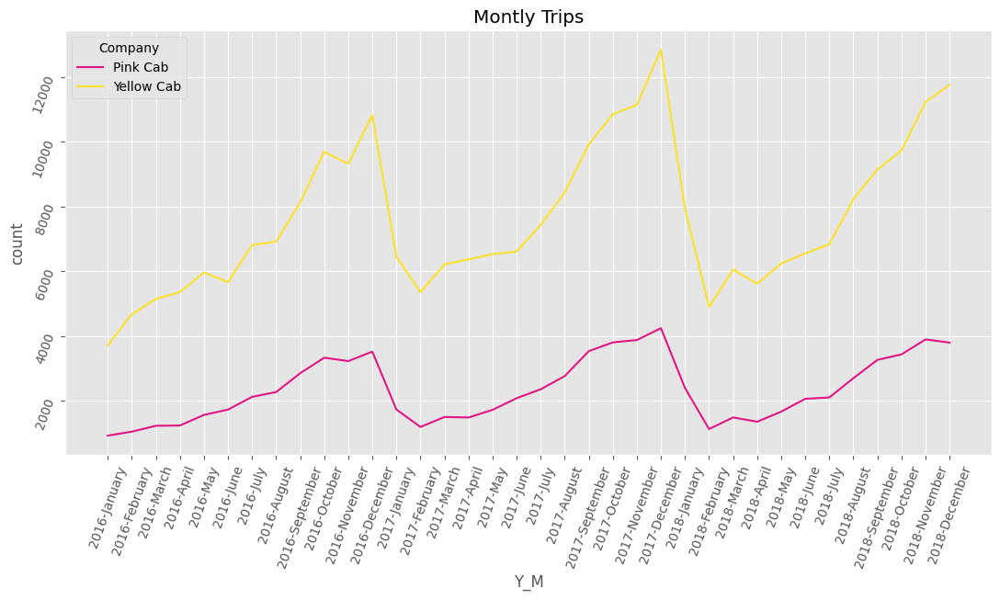

In [71]:
#@title Montly seasonality
#@markdown Below graph shows clear signs of seasonality in cab data for both companies.
#@markdown <br>The number of trips at the month of February is the lowest and
#@markdown the number of trips at the month of December is the highest for all the years.
#@markdown <br>For both Cab companies, there is a slight upward trend throughout the years.
master_df['Month']=master_df.index.month_name()
cab_trips=master_df.groupby(['Year','Month','Company']).Transaction_id.count().reset_index().rename(columns={'Transaction_id':'count'})
cab_trips['Y_M']=cab_trips['Year'].astype(str)+'-'+cab_trips['Month'].astype(str)
months = ["January", "February", "March", "April", "May", "June",
          "July", "August", "September", "October", "November", "December"]
cab_trips['Month'] = pd.Categorical(cab_trips['Month'],
                                     categories=months, ordered=True)
cab_trips.sort_values(by=['Year','Month'],inplace=True)
plt.figure(figsize = (13,6))
ax = sns.lineplot(x = 'Y_M', y = 'count', data = cab_trips, hue = 'Company',
             palette = PALETTE, hue_order=HUE_ORDER)
ax.set_title("Montly Trips")
ax.tick_params(labelrotation=70);

<Figure size 1300x600 with 0 Axes>

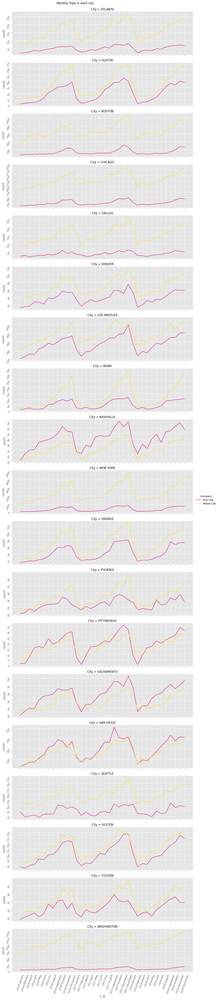

In [86]:
#@title Monthly Seasonality for each city
#@markdown Overall, Yellow Cab company seems to perform during the given time period.
#@markdown <br>Pink Cab has more trips in only 2 cities: `Nashville` and `Sacramento.`
master_df['Month']=master_df.index.month_name()
cab_trips=master_df.groupby(['Year','Month','City','Company']).Transaction_id.count().reset_index().rename(columns={'Transaction_id':'count'})
cab_trips['Y_M']=cab_trips['Year'].astype(str)+'-'+cab_trips['Month'].astype(str)
months = ["January", "February", "March", "April", "May", "June",
          "July", "August", "September", "October", "November", "December"]
cab_trips['Month'] = pd.Categorical(cab_trips['Month'],
                                     categories=months, ordered=True)
cab_trips.sort_values(by=['Year','Month'],inplace=True)
# cab_trips
plt.figure(figsize = (13,6))
g=sns.FacetGrid(cab_trips,hue='Company',col='City',col_wrap=1, sharey=False,
                hue_order=HUE_ORDER, palette=PALETTE, margin_titles=True)
g.map_dataframe(sns.lineplot,x='Y_M',y='count')
g.figure.set_figwidth(15);
g.fig.subplots_adjust(top=0.97);
g.fig.suptitle("Monthly Trips in each city");
g.add_legend();
# ax.set_title("Montly Trips")
g.tick_params(labelrotation=70);